In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

# Warm Up

## Picture as an array

Images are just 3D arrays. You can think of them as of three 2D arrays, each of N rows and M columns.

Shape of image is (N, M, 3). One array for each channel: red, green and blue.

`im[0, 1, 2]` is value of blue (0: r, 1: g, 2: b) channel for pixel at 0 row and 1 column.

In [4]:
im1 = cv2.imread('/home/sv9t/Documents/df_midsommar.png')
im2 = cv2.imread('/home/sv9t/Documents/df_drive.png')

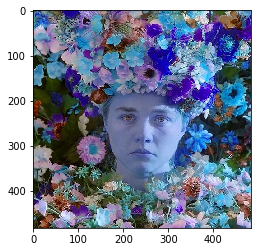

In [5]:
plt.imshow(im1);

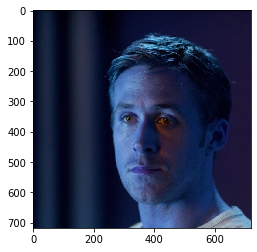

In [6]:
plt.imshow(im2);

Sort all values along axis 0, i.e. between rows

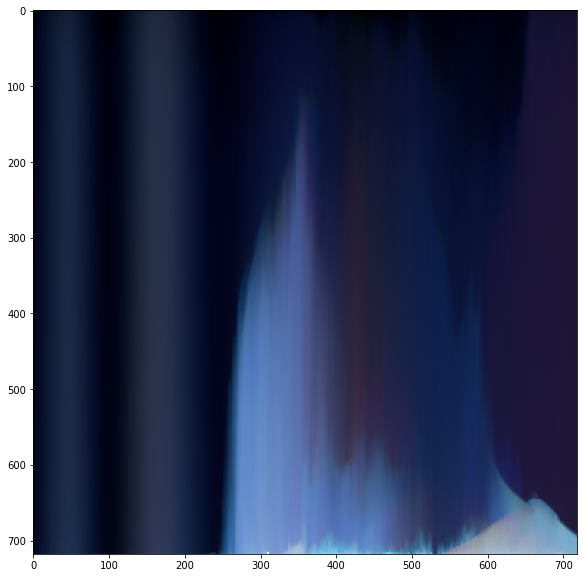

In [12]:
plt.figure(figsize=(10, 10))
plt.imshow(np.sort(im2, axis=0));

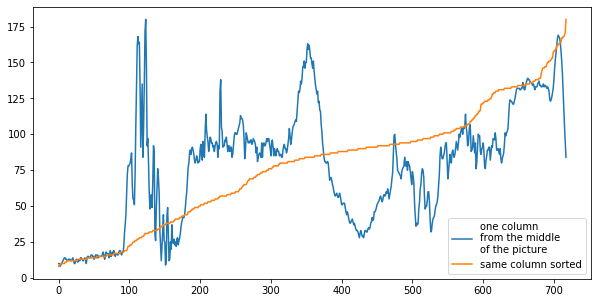

In [141]:
one_column = im2[:, 359, 1]
plt.figure(figsize=(10, 5))
plt.plot(one_column, label='one column\nfrom the middle\nof the picture');
plt.plot(np.sort(one_column), label='same column sorted');
plt.legend();

Merge one layer from sorted image and two from the original

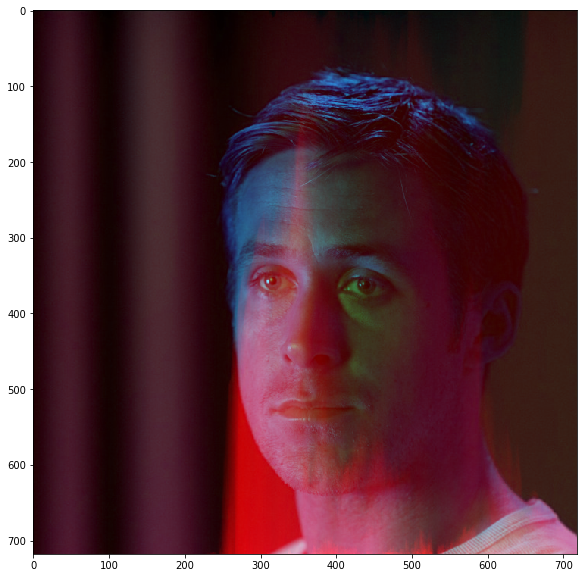

In [19]:
srtd = np.sort(im2, axis=0)
plt.figure(figsize=(10, 10))
plt.imshow(np.stack((srtd[:, :, 2], im2[:, :, 0], im2[:, :, 1]), axis=2));

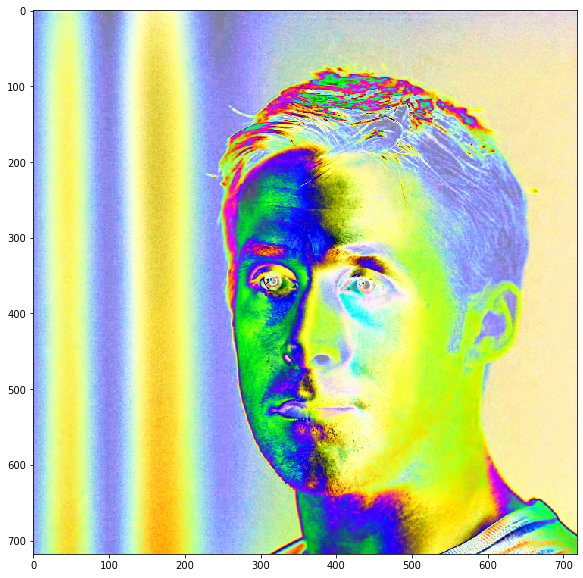

In [100]:
plt.figure(figsize=(10, 10))
plt.imshow((((np.sin(im2 / 20) + 1) / 2) * 255).astype(int));

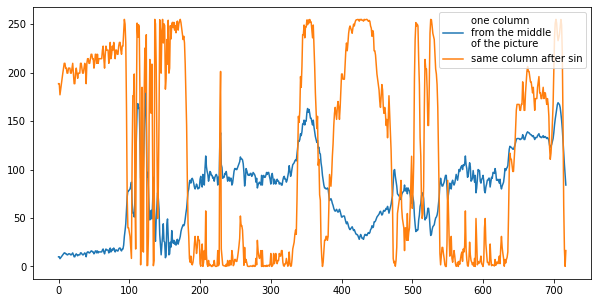

In [142]:
one_column = im2[:, 359, 1]
plt.figure(figsize=(10, 5))
plt.plot(one_column, label='one column\nfrom the middle\nof the picture');
plt.plot((((np.sin(one_column / 20) + 1) / 2) * 255), label='same column after sin');
plt.legend();

$sin(x) \in [-1, 1]$  
sine values are in interval from -1 to 1, so we need to map them into color channel values from 0 to 255, so we use this transform:  
$255(sin(x) + 1) / 2$

Sine full period is $2\pi$ but original color values are much greater, so we need to scale argument in order to make result more smooth, that's why we divide it by 20 (you can use arbitrary number). Smaller arg results in more smooth picture.

In [121]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

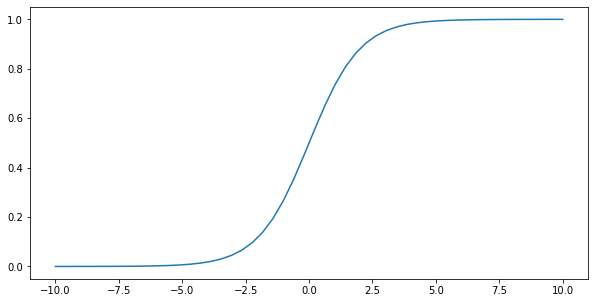

In [144]:
plt.figure(figsize=(10, 5))
x = np.linspace(-10, 10, 50)
plt.plot(x, sigmoid(x));

Sigmoid function flattens all values that are far from zero.

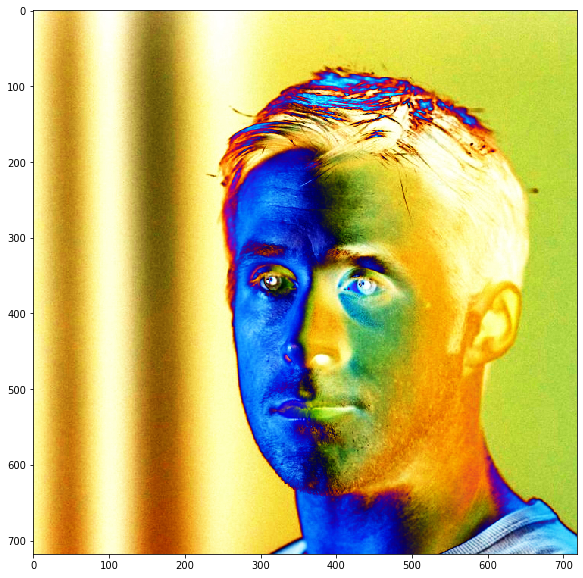

In [134]:
plt.figure(figsize=(10, 10))
plt.imshow((((np.sin(sigmoid(im2 / 100) * 5 * np.pi) + 1) / 2) * 255).astype(int));

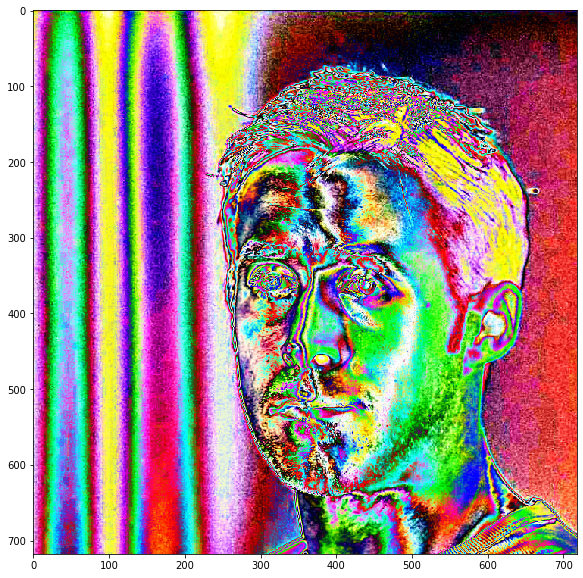

In [136]:
plt.figure(figsize=(10, 10))
plt.imshow((((np.sin(sigmoid(im2 / 100) * 25 * np.pi) + 1) / 2) * 255).astype(int));

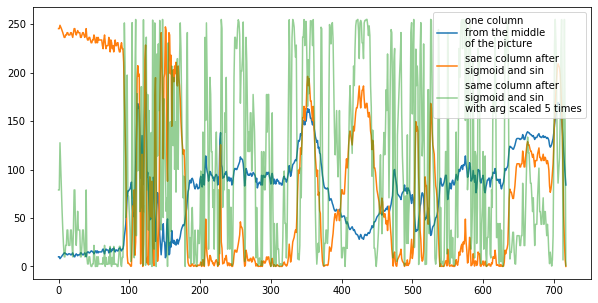

In [146]:
# one_column = im2[:, 359, 1]
plt.figure(figsize=(10, 5))
plt.plot(one_column, label='one column\nfrom the middle\nof the picture');
plt.plot((((np.sin(sigmoid(one_column / 100) * 5 * np.pi) + 1) / 2) * 255),
         label='same column after\nsigmoid and sin');
plt.plot((((np.sin(sigmoid(one_column / 100) * 25 * np.pi) + 1) / 2) * 255),
         label='same column after\nsigmoid and sin\nwith arg scaled 5 times',
        alpha=0.5);
plt.legend();

Red channel from sorted picture  
Green from original  
And Blue afger sine function

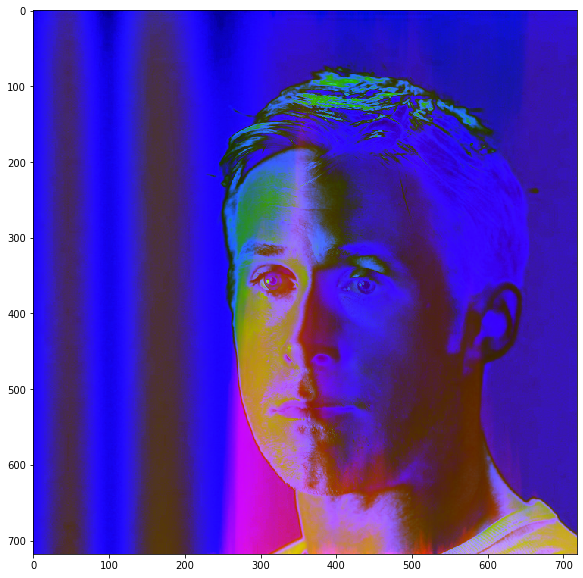

In [125]:
plt.figure(figsize=(10, 10))
plt.imshow(np.stack((srtd[:, :, 2],
                     im2[:, :, 1],
                     (((np.sin(im2[:, :, 2] / 20) + 1) / 2) * 255).astype(int)), axis=2));

# Image as matrix
## Spectral biclustering

https://scikit-learn.org/stable/auto_examples/bicluster/plot_spectral_biclustering.html#sphx-glr-auto-examples-bicluster-plot-spectral-biclustering-py

In [45]:
from sklearn.cluster import SpectralBiclustering, SpectralCoclustering

In [116]:
%%time
model = SpectralCoclustering(n_clusters=6)
model.fit(np.max(im1, axis=2))

CPU times: user 736 ms, sys: 574 ms, total: 1.31 s
Wall time: 153 ms


Here we just rearrange columns and rows by cluster labels

In [117]:
fit_data = im1[np.argsort(model.row_labels_)]
fit_data = fit_data[:, np.argsort(model.column_labels_)]

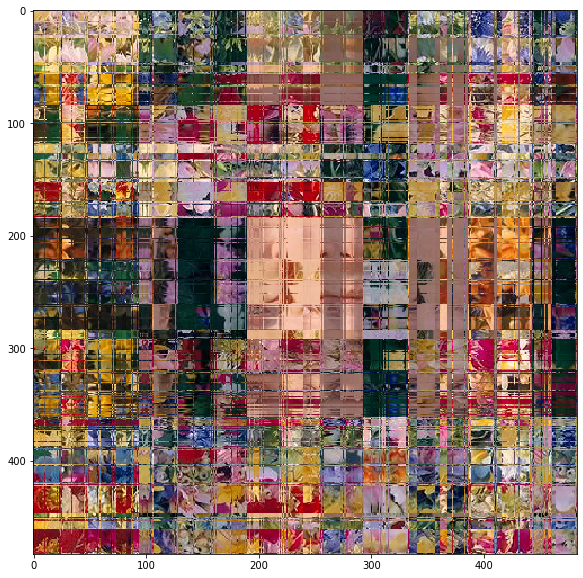

In [118]:
plt.figure(figsize=(10, 10))
plt.imshow(fit_data[:, :, [2, 1, 0]]);

## Example from Sklearn docs

https://www.sklearn.org/auto_examples/plot_multioutput_face_completion.html
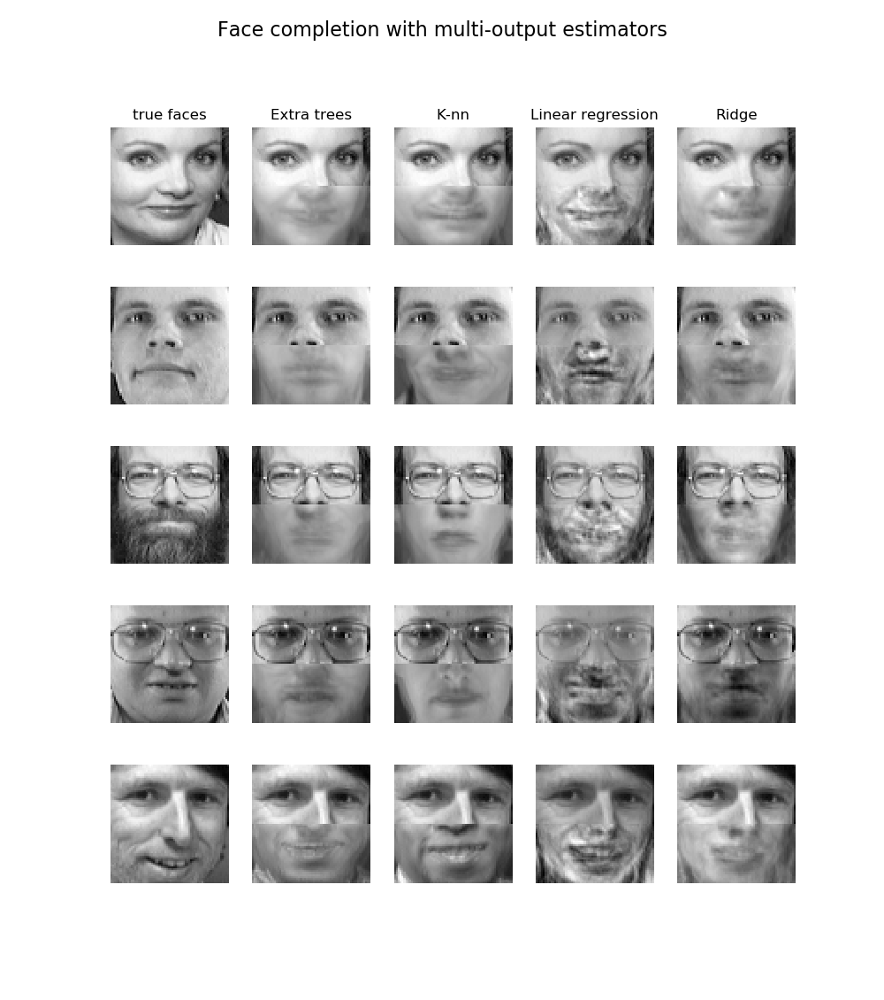

# Coordinates as additional dimensions

In [149]:
def to5d(im):
    arr = []
    for i in range(im.shape[0]):
        for j in range(im.shape[1]):
            b, g, r = im[i][j]
            arr.append((i, j, r, g, b))
            
    return np.array(arr)

In [153]:
imarr = to5d(im2)

In [154]:
imarr[:10]

array([[ 0,  0, 12,  0,  0],
       [ 0,  1, 15,  1,  1],
       [ 0,  2, 17,  3,  3],
       [ 0,  3, 18,  4,  3],
       [ 0,  4, 19,  5,  4],
       [ 0,  5, 19,  5,  2],
       [ 0,  6, 19,  5,  2],
       [ 0,  7, 23,  8,  3],
       [ 0,  8, 23,  8,  3],
       [ 0,  9, 24,  9,  4]])

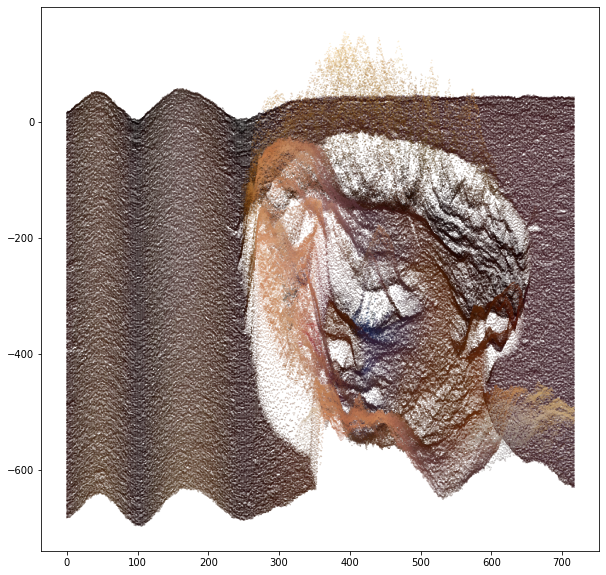

In [155]:
plt.figure(figsize=(10, 10))
plt.scatter(imarr[:, 1], # column index as is
            imarr[:, 2] - imarr[:, 0], # row index shifted with value of red channel
            c=np.hstack((imarr[:, 2:]/255, np.ones((imarr.shape[0], 1)))), # pass colors of pixels to colors of points
            marker='.', alpha=0.5, s=0.3); # shape, opacity and size of the points

## Colors as coordinates

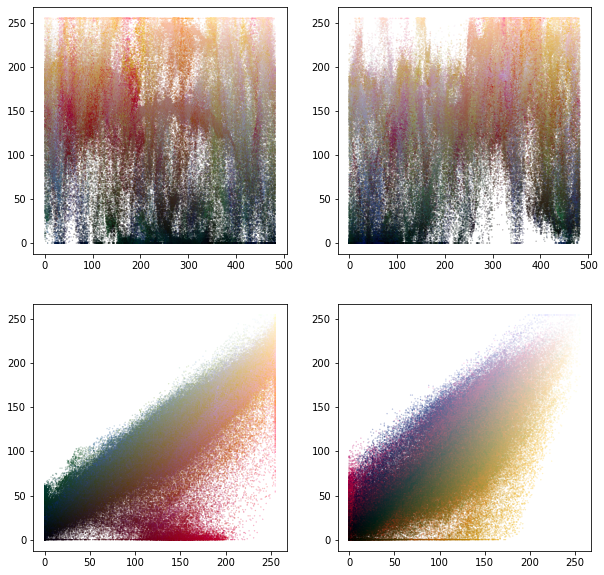

In [198]:
colors = imarr[:, 2:] / 255
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 10))
ax1.scatter(imarr[:, 0], imarr[:, 2], marker='.', alpha=0.5, s=0.3, c=colors)
ax2.scatter(imarr[:, 1], imarr[:, 2], marker='.', alpha=0.5, s=0.3, c=colors)
ax3.scatter(imarr[:, 2], imarr[:, 3], marker='.', alpha=0.5, s=0.3, c=colors)
ax4.scatter(imarr[:, 3], imarr[:, 4], marker='.', alpha=0.5, s=0.3, c=colors);

## Back to 2D

In [156]:
from sklearn.decomposition import PCA
import trimap

In [159]:
imarr = to5d(im1)

In [160]:
%%time
pca = PCA(n_components=2)
emb = pca.fit_transform(imarr)

CPU times: user 1.31 s, sys: 1.52 s, total: 2.83 s
Wall time: 259 ms


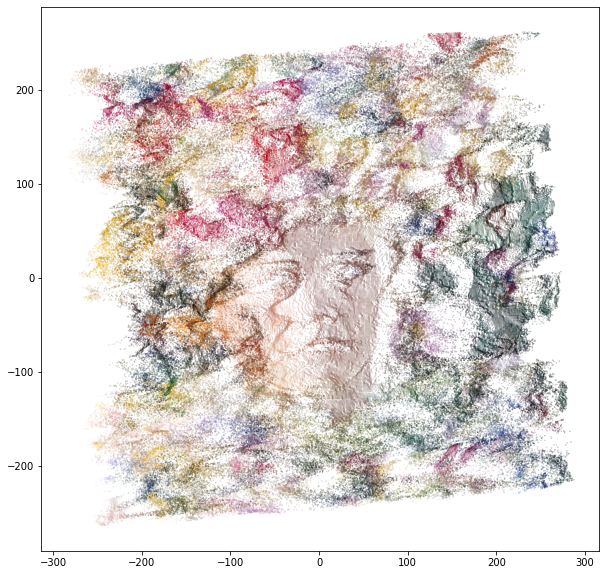

In [162]:
plt.figure(figsize=(10, 10))
plt.scatter(emb[:, 0],
            -emb[:, 1],
            c=np.hstack((imarr[:, 2:]/255, np.ones((imarr.shape[0], 1)))), # pass colors of pixels to colors of points
            marker='.', alpha=0.5, s=0.3); # shape, opacity and size of the points

In [163]:
reducer = trimap.TRIMAP(n_dims=2)

TRIMAP(n_inliers=10, n_outliers=5, n_random=5, distance=euclidean, lr=1000.0, n_iters=400, weight_adj=500.0, apply_pca=True, opt_method=dbd, verbose=True, return_seq=False)


In [164]:
%%time
triemb = reducer.fit_transform(imarr)

running TriMap on 233289 points with dimension 5
pre-processing
found nearest neighbors
sampled triplets
running TriMap with dbd
Iteration:  100, Loss: 10379.281, Violated triplets: 0.0809
Iteration:  200, Loss: 9668.943, Violated triplets: 0.0754
Iteration:  300, Loss: 9200.192, Violated triplets: 0.0717
Iteration:  400, Loss: 8953.998, Violated triplets: 0.0698
Elapsed time: 0:03:40.506674
CPU times: user 3min 52s, sys: 1.48 s, total: 3min 54s
Wall time: 3min 40s


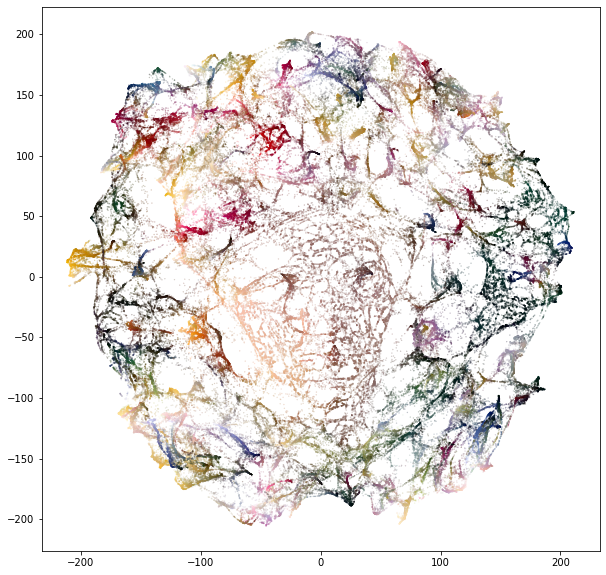

In [166]:
plt.figure(figsize=(10, 10))
plt.scatter(triemb[:, 0],
            -triemb[:, 1],
            c=np.hstack((imarr[:, 2:]/255, np.ones((imarr.shape[0], 1)))), # pass colors of pixels to colors of points
            marker='.', alpha=0.5, s=0.3); # shape, opacity and size of the points

## Mix two images in higher dimensions

There are two ways:
1. Concatenate two 5-dimensional representations
2. Share pixel coordinates and concatenate color values to get 8-dims

In [167]:
im1 = cv2.resize(im1, (500, 500))
im2 = cv2.resize(im2, (500, 500))

### Concatenate 5Ds

In [168]:
arr5 = np.vstack((to5d(im1), to5d(im2)))

In [169]:
pca = PCA(n_components=2)
emb = pca.fit_transform(arr5)

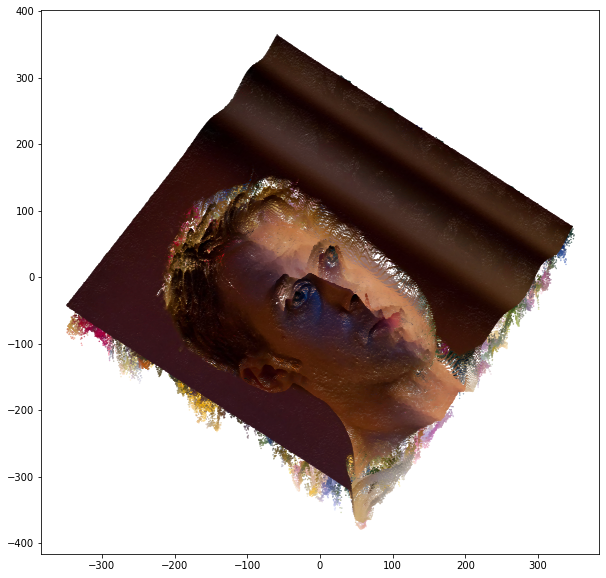

In [170]:
plt.figure(figsize=(10, 10))
plt.scatter(emb[:, 1], -emb[:, 0],
            c=np.hstack([arr5[:, 2:]/ 255, np.ones((arr5.shape[0], 1))]),
            marker='.', s=0.7);

In [171]:
%%time
triemb = reducer.fit_transform(arr5)

running TriMap on 500000 points with dimension 5
using stored triplets
running TriMap with dbd
Iteration:  100, Loss: 84084.336, Violated triplets: 0.6553
Iteration:  200, Loss: 30752.668, Violated triplets: 0.2397
Iteration:  300, Loss: 21658.234, Violated triplets: 0.1688
Iteration:  400, Loss: 18600.334, Violated triplets: 0.1450
Elapsed time: 0:02:46.216641
CPU times: user 2min 59s, sys: 2.68 s, total: 3min 2s
Wall time: 2min 46s


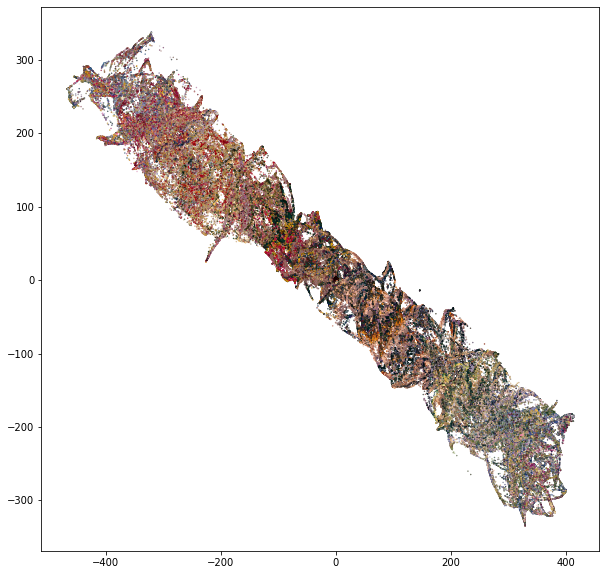

In [172]:
plt.figure(figsize=(10, 10))
plt.scatter(triemb[:, 1], -triemb[:, 0],
            c=np.hstack([arr5[:, 2:]/ 255, np.ones((arr5.shape[0], 1))]),
            marker='.', s=0.7);

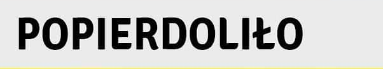

# 8D

In [183]:
def to8d(im_0, im_1):
    assert im_0.shape == im_1.shape, "images should have same shape"
    arr = []
    for i in range(im_0.shape[0]):
        for j in range(im_0.shape[1]):
            b0, g0, r0 = im_0[i][j]
            b1, g1, r1 = im_1[i][j]
            arr.append((i, j, r0, g0, b0, r1, g1, b1))
            
    return np.array(arr)

In [184]:
arr8 = to8d(im1, im2)

In [185]:
pca = PCA(n_components=2)
emb = pca.fit_transform(arr8)

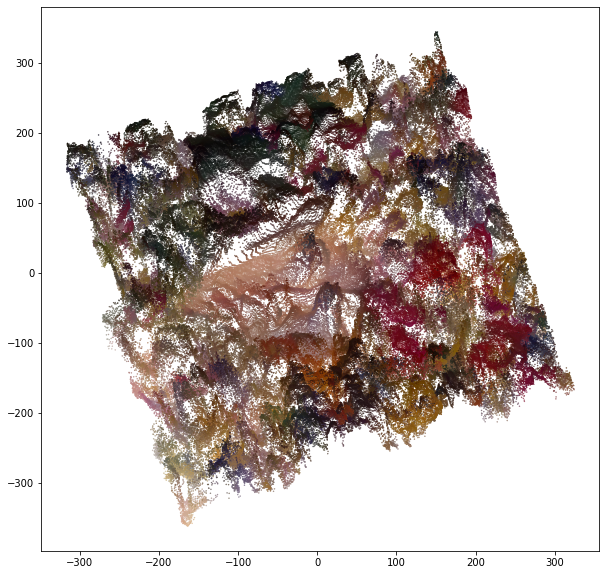

In [189]:
plt.figure(figsize=(10, 10))
plt.scatter(emb[:, 1], -emb[:, 0],
            c=np.hstack([(arr8[:, 2:5] + arr8[:, 5:]) / (255 * 2) ,
                         np.ones((arr8.shape[0], 1))]),
            marker='.', s=0.7);

In [190]:
%%time
triemb = reducer.fit_transform(arr8)

running TriMap on 250000 points with dimension 8
using stored triplets
running TriMap with dbd
Iteration:  100, Loss: 60204.551, Violated triplets: 0.4692
Iteration:  200, Loss: 29866.711, Violated triplets: 0.2328
Iteration:  300, Loss: 23535.516, Violated triplets: 0.1834
Iteration:  400, Loss: 19757.111, Violated triplets: 0.1540
Elapsed time: 0:02:44.057309
CPU times: user 2min 51s, sys: 2.55 s, total: 2min 54s
Wall time: 2min 44s


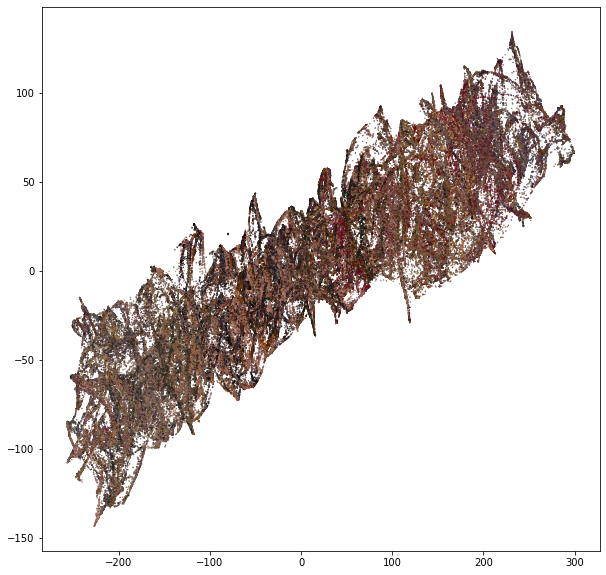

In [191]:
plt.figure(figsize=(10, 10))
plt.scatter(triemb[:, 1], -triemb[:, 0],
            c=np.hstack([(arr8[:, 2:5] + arr8[:, 5:]) / (255 * 2) ,
                         np.ones((arr8.shape[0], 1))]),
            marker='.', s=0.7);

## Draw them in 3D

In [199]:
from mpl_toolkits.mplot3d import Axes3D

In [202]:
imarr = to5d(im2)

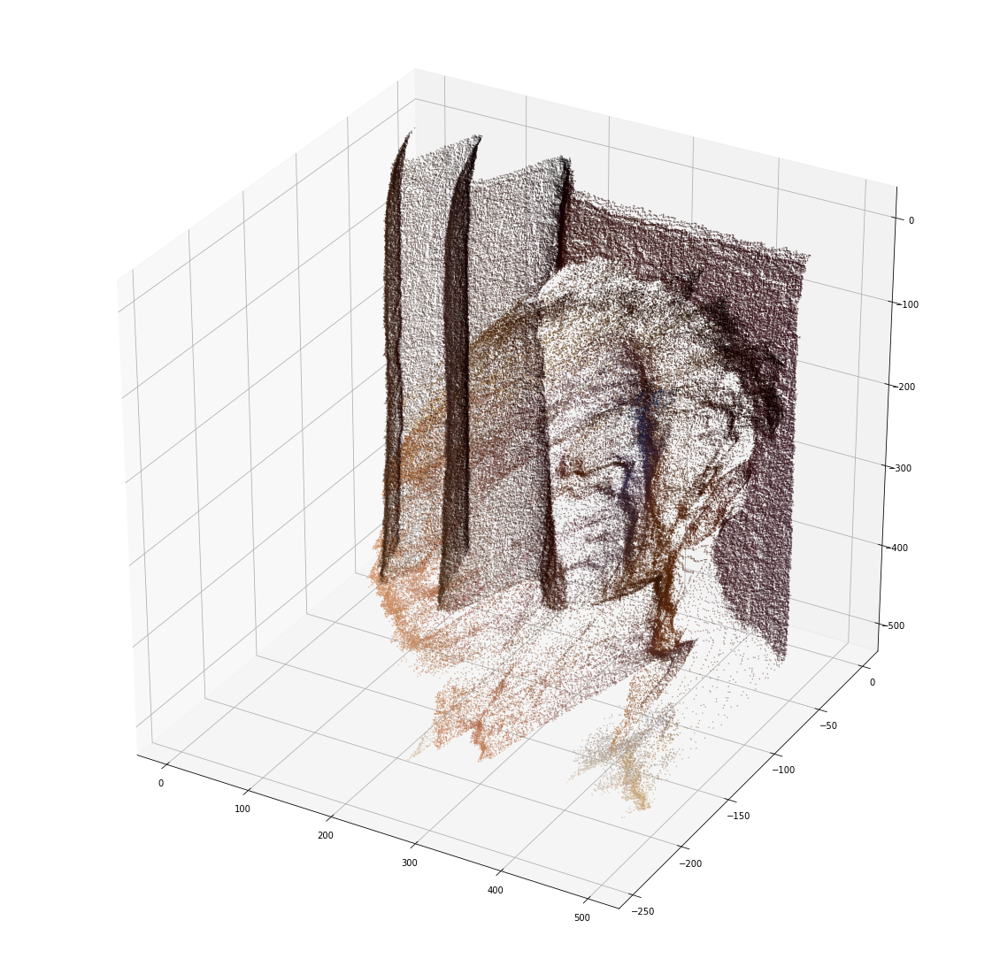

In [208]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(imarr[:, 1], -imarr[:, 2], -imarr[:, 0],
            c=np.hstack([imarr[:, 2:]/ 255, np.ones((imarr.shape[0], 1))]),
            marker='.', s=0.7);

In [209]:
pca = PCA(n_components=3)
emb3 = pca.fit_transform(arr8)

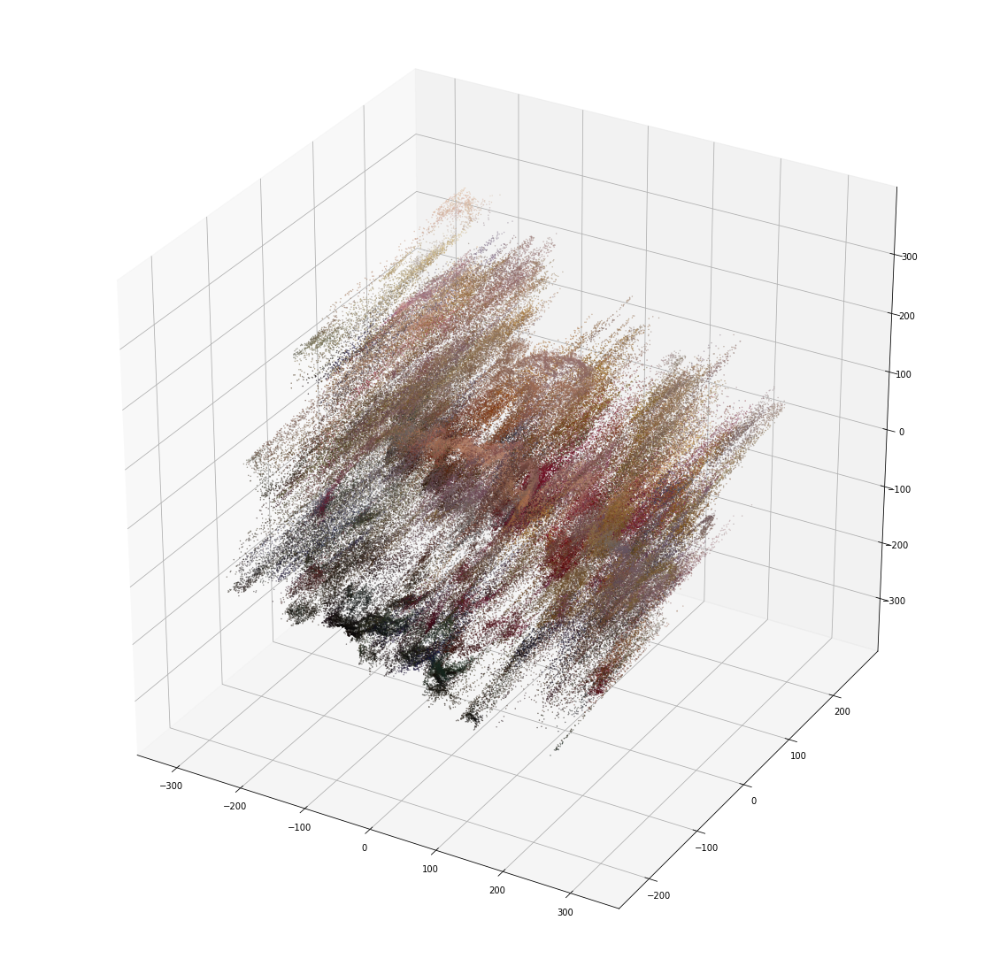

In [214]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(emb3[:, 1], emb3[:, 2], emb3[:, 0],
        c=np.hstack([(arr8[:, 2:5] + arr8[:, 5:]) / (255 * 2) ,
                                 np.ones((arr8.shape[0], 1))]),
            marker='.', s=0.7);